In [22]:
# Cell 1: Import Libraries and Setup
import os
import random
import numpy as np
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms
import torchvision.utils as vutils
from torch.utils.data import Dataset, DataLoader
from PIL import Image
from tqdm import tqdm
import time

# Set random seeds for reproducibility
manualSeed = 999
random.seed(manualSeed)
torch.manual_seed(manualSeed)
torch.use_deterministic_algorithms(True)  # For reproducibility

# Device configuration
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# Hyperparameters
dataroot = "./data"  # Path to anime faces folder
workers = 0
batch_size = 128
image_size = 64
nc = 3  # Number of channels (RGB)
nz = 100  # Latent vector size
ngf = 64  # Generator feature maps
ndf = 64  # Discriminator feature maps
num_epochs = 50
lr = 0.0002
beta1 = 0.5  # Adam optimizer beta1

print("Configuration completed successfully!")

Using device: cuda:0
Configuration completed successfully!


In [23]:
# Cell 2: Dataset Statistics and Exploration
def analyze_dataset(root_path):
    """Analyze dataset statistics including image count and formats."""
    if not os.path.exists(root_path):
        print(f"Error: Directory {root_path} does not exist!")
        return None
    
    image_extensions = {'.jpg', '.jpeg', '.png', '.bmp', '.gif', '.webp'}
    image_files = []
    
    for file in os.listdir(root_path):
        ext = os.path.splitext(file)[1].lower()
        if ext in image_extensions:
            image_files.append(os.path.join(root_path, file))
    
    print(f"Total Images Found: {len(image_files)}")
    
    # Analyze image properties
    widths, heights, modes = [], [], []
    for img_path in image_files[:100]:  # Sample first 100 for speed
        try:
            with Image.open(img_path) as img:
                widths.append(img.width)
                heights.append(img.height)
                modes.append(img.mode)
        except Exception as e:
            print(f"Error reading {img_path}: {e}")
    
    print(f"Width - Min: {min(widths)}, Max: {max(widths)}, Avg: {np.mean(widths):.1f}")
    print(f"Height - Min: {min(heights)}, Max: {max(heights)}, Avg: {np.mean(heights):.1f}")
    print(f"Color Modes: {set(modes)}")
    
    return image_files

# Execute analysis
image_paths = analyze_dataset(dataroot)
print(f"\nDataset located at: {os.path.abspath(dataroot)}")

Total Images Found: 2500
Width - Min: 96, Max: 96, Avg: 96.0
Height - Min: 96, Max: 96, Avg: 96.0
Color Modes: {'RGB'}

Dataset located at: d:\DeskTop\3.16\动漫头像gan\data


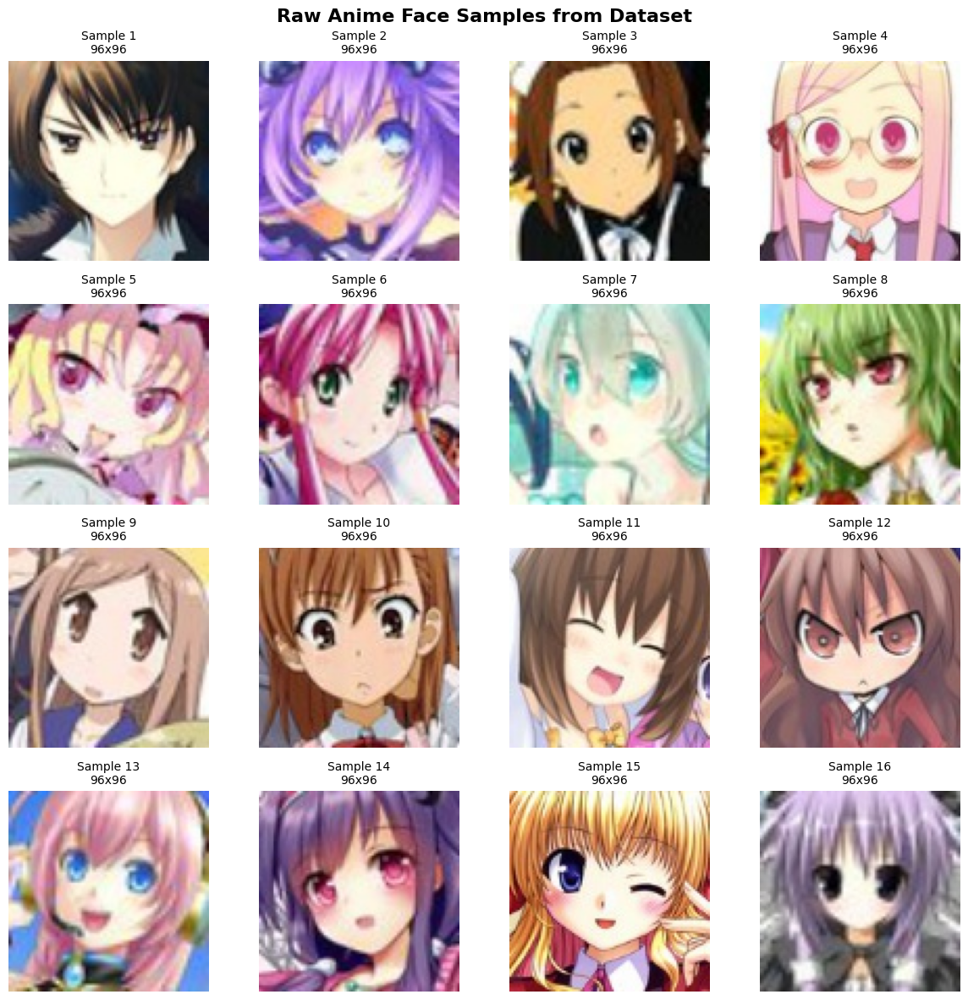

In [24]:
# Cell 3: Visualize Raw Dataset Samples
def show_raw_samples(paths, num_samples=16):
    """Display random raw samples from the dataset."""
    if not paths:
        print("No images found!")
        return
    
    sample_paths = random.sample(paths, min(num_samples, len(paths)))
    
    fig, axes = plt.subplots(4, 4, figsize=(12, 12))
    fig.suptitle('Raw Anime Face Samples from Dataset', fontsize=16, fontweight='bold')
    
    for idx, (ax, img_path) in enumerate(zip(axes.flat, sample_paths)):
        img = Image.open(img_path)
        ax.imshow(img)
        ax.set_title(f'Sample {idx+1}\n{img.size[0]}x{img.size[1]}', fontsize=10)
        ax.axis('off')
    
    plt.tight_layout()
    plt.savefig('raw_samples_grid.png', dpi=150, bbox_inches='tight')
    plt.show()

# Show raw samples
show_raw_samples(image_paths, 16)

In [25]:
# Cell 4: Data Preprocessing Pipeline Definition
class AnimeDataset(Dataset):
    """Custom Dataset for Anime Faces with preprocessing."""
    def __init__(self, root_dir, transform=None):
        self.root_dir = root_dir
        self.transform = transform
        self.image_files = [f for f in os.listdir(root_dir) 
                           if f.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp'))]
        
    def __len__(self):
        return len(self.image_files)
    
    def __getitem__(self, idx):
        img_name = os.path.join(self.root_dir, self.image_files[idx])
        image = Image.open(img_name).convert('RGB')
        
        if self.transform:
            image = self.transform(image)
            
        return image

# Define preprocessing pipeline
preprocessing_pipeline = transforms.Compose([
    transforms.Resize(image_size),           # Step 1: Resize to 64x64
    transforms.CenterCrop(image_size),        # Step 2: Center crop
    transforms.ToTensor(),                    # Step 3: Convert to Tensor [0,1]
    transforms.Normalize((0.5, 0.5, 0.5),     # Step 4: Normalize to [-1,1]
                        (0.5, 0.5, 0.5))
])

print("Preprocessing Pipeline Defined:")
print("1. Resize -> 2. CenterCrop -> 3. ToTensor -> 4. Normalize")

Preprocessing Pipeline Defined:
1. Resize -> 2. CenterCrop -> 3. ToTensor -> 4. Normalize


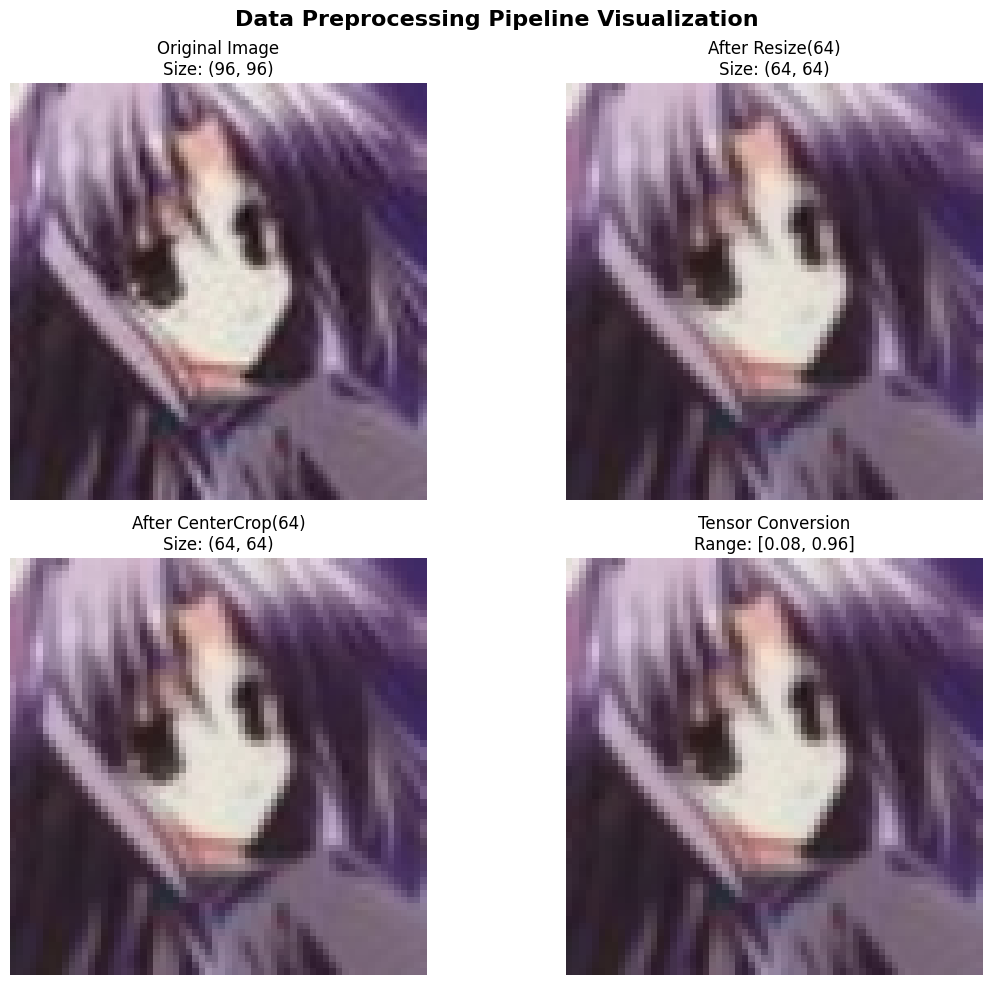

In [26]:
# Cell 5: Visualize Preprocessing Steps
def visualize_preprocessing_steps(image_path):
    """Show effect of each preprocessing step on a single image."""
    original = Image.open(image_path).convert('RGB')
    
    # Define individual steps for visualization
    steps = [
        ("Original Image", original),
        ("After Resize(64)", transforms.Resize(image_size)(original)),
        ("After CenterCrop(64)", transforms.CenterCrop(image_size)(
            transforms.Resize(image_size)(original))),
        ("Tensor Conversion", transforms.ToTensor()(
            transforms.CenterCrop(image_size)(
                transforms.Resize(image_size)(original)))),
    ]
    
    fig, axes = plt.subplots(2, 2, figsize=(12, 10))
    fig.suptitle('Data Preprocessing Pipeline Visualization', fontsize=16, fontweight='bold')
    
    for idx, (title, img) in enumerate(steps):
        ax = axes[idx // 2, idx % 2]
        
        if isinstance(img, torch.Tensor):
            # Convert tensor back to displayable format
            img_np = img.permute(1, 2, 0).numpy()
            ax.imshow(np.clip(img_np, 0, 1))
            ax.set_title(f'{title}\nRange: [{img_np.min():.2f}, {img_np.max():.2f}]', fontsize=12)
        else:
            ax.imshow(img)
            ax.set_title(f'{title}\nSize: {img.size}', fontsize=12)
        
        ax.axis('off')
    
    plt.tight_layout()
    plt.savefig('preprocessing_steps.png', dpi=150, bbox_inches='tight')
    plt.show()

# Visualize preprocessing on random sample
if image_paths:
    visualize_preprocessing_steps(random.choice(image_paths))

DataLoader created with 2500 images
Batches per epoch: 19


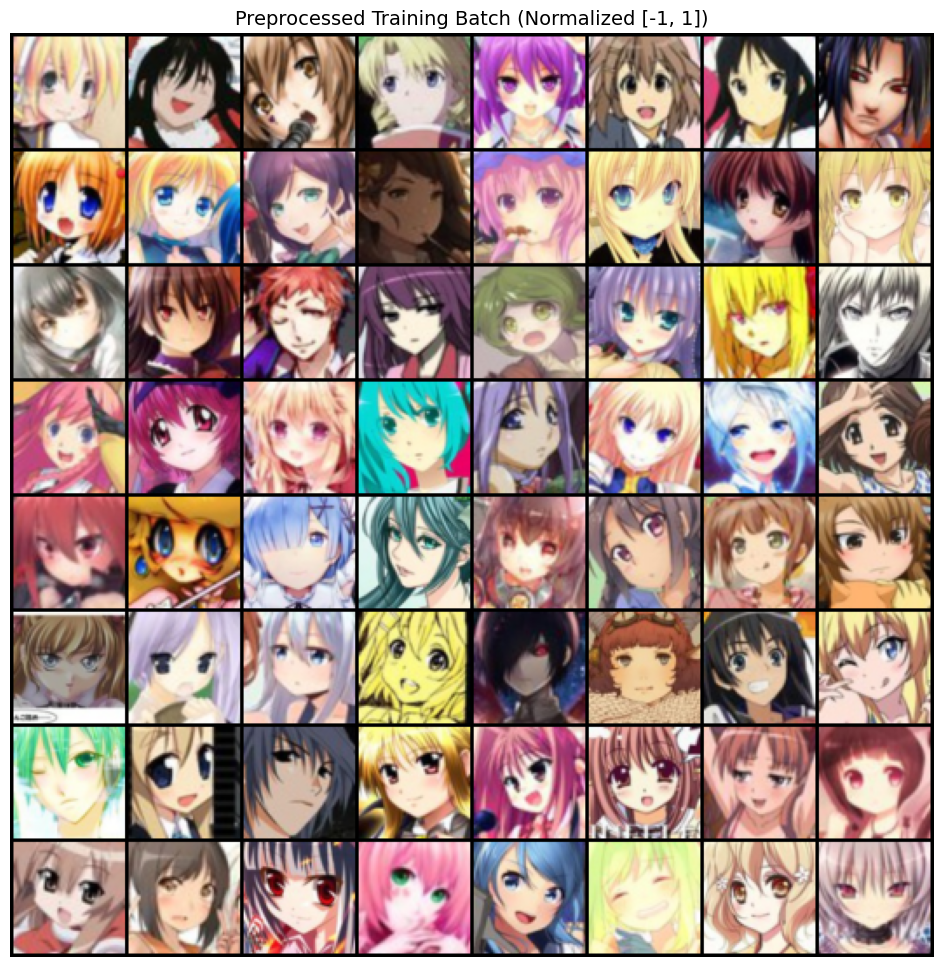

In [27]:
# Cell 6: Create DataLoader
dataset = AnimeDataset(dataroot, transform=preprocessing_pipeline)
dataloader = DataLoader(dataset, batch_size=batch_size,
                       shuffle=True, num_workers=workers, drop_last=True)

print(f"DataLoader created with {len(dataset)} images")
print(f"Batches per epoch: {len(dataloader)}")

# Visualize a batch
real_batch = next(iter(dataloader))
plt.figure(figsize=(12, 12))
plt.title("Preprocessed Training Batch (Normalized [-1, 1])", fontsize=14)
plt.imshow(np.transpose(vutils.make_grid(real_batch[:64], padding=2, normalize=True).cpu(), (1, 2, 0)))
plt.axis("off")
plt.savefig('preprocessed_batch.png', dpi=150, bbox_inches='tight')
plt.show()

In [28]:
# Cell 7: Generator Network Architecture
class Generator(nn.Module):
    """DCGAN Generator - Transforms latent vector into 64x64 RGB image."""
    def __init__(self):
        super(Generator, self).__init__()
        self.main = nn.Sequential(
            # Input: nz x 1 x 1
            nn.ConvTranspose2d(nz, ngf * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),
            # State: (ngf*8) x 4 x 4
            
            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            # State: (ngf*4) x 8 x 8
            
            nn.ConvTranspose2d(ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            # State: (ngf*2) x 16 x 16
            
            nn.ConvTranspose2d(ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            # State: ngf x 32 x 32
            
            nn.ConvTranspose2d(ngf, nc, 4, 2, 1, bias=False),
            nn.Tanh()
            # Output: nc x 64 x 64
        )

    def forward(self, input):
        return self.main(input)

# Instantiate generator
netG = Generator().to(device)
print("Generator Architecture:")
print(netG)
print(f"\nTotal Parameters: {sum(p.numel() for p in netG.parameters()):,}")

Generator Architecture:
Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)

In [29]:
# Cell 8: Discriminator Network Architecture
class Discriminator(nn.Module):
    """DCGAN Discriminator - Classifies real vs fake 64x64 images."""
    def __init__(self):
        super(Discriminator, self).__init__()
        self.main = nn.Sequential(
            # Input: nc x 64 x 64
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # State: ndf x 32 x 32
            
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # State: (ndf*2) x 16 x 16
            
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # State: (ndf*4) x 8 x 8
            
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            # State: (ndf*8) x 4 x 4
            
            nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
            # Output: 1 x 1 x 1 (probability)
        )

    def forward(self, input):
        return self.main(input).view(-1, 1).squeeze(1)

# Instantiate discriminator
netD = Discriminator().to(device)
print("Discriminator Architecture:")
print(netD)
print(f"\nTotal Parameters: {sum(p.numel() for p in netD.parameters()):,}")

Discriminator Architecture:
Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)

T

In [30]:
# Cell 9: Loss Functions and Optimizers
criterion = nn.BCELoss()

# Fixed noise for consistent generation visualization
fixed_noise = torch.randn(64, nz, 1, 1, device=device)

# Real and Fake labels
real_label = 1.
fake_label = 0.

# Adam optimizers
optimizerD = optim.Adam(netD.parameters(), lr=lr, betas=(beta1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=lr, betas=(beta1, 0.999))

print("Loss Function: Binary Cross Entropy")
print("Optimizer: Adam (lr=0.0002, beta1=0.5)")
print(f"Fixed noise tensor shape: {fixed_noise.shape}")

Loss Function: Binary Cross Entropy
Optimizer: Adam (lr=0.0002, beta1=0.5)
Fixed noise tensor shape: torch.Size([64, 100, 1, 1])


Starting Training Loop...
[0/50][0/19] Loss_D: 1.3228 | Loss_G: 2.9323 | D(x): 0.5570 | D(G(z)): 0.5098/0.0563


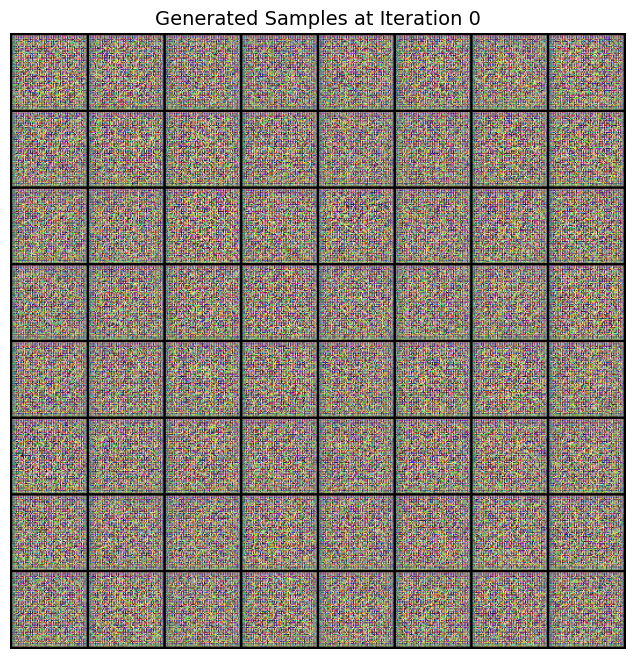

Epoch 0 completed in 8.71s
[1/50][0/19] Loss_D: 0.0522 | Loss_G: 6.0227 | D(x): 0.9707 | D(G(z)): 0.0197/0.0036
Epoch 1 completed in 1.82s
[2/50][0/19] Loss_D: 0.3209 | Loss_G: 8.7487 | D(x): 0.7783 | D(G(z)): 0.0002/0.0002
Epoch 2 completed in 1.58s
[3/50][0/19] Loss_D: 0.6020 | Loss_G: 3.9769 | D(x): 0.7217 | D(G(z)): 0.1775/0.0238
Epoch 3 completed in 1.58s
[4/50][0/19] Loss_D: 0.7604 | Loss_G: 4.7439 | D(x): 0.7950 | D(G(z)): 0.3496/0.0178
Epoch 4 completed in 1.55s
[5/50][0/19] Loss_D: 0.9822 | Loss_G: 6.1957 | D(x): 0.9114 | D(G(z)): 0.5501/0.0028
Epoch 5 completed in 1.58s
[6/50][0/19] Loss_D: 0.4261 | Loss_G: 5.0039 | D(x): 0.8588 | D(G(z)): 0.2153/0.0076
Epoch 6 completed in 1.58s
[7/50][0/19] Loss_D: 0.0838 | Loss_G: 3.2269 | D(x): 0.9784 | D(G(z)): 0.0582/0.0477
Epoch 7 completed in 1.58s
[8/50][0/19] Loss_D: 0.5595 | Loss_G: 3.7484 | D(x): 0.7034 | D(G(z)): 0.1075/0.0328
Epoch 8 completed in 1.56s
[9/50][0/19] Loss_D: 0.5614 | Loss_G: 3.4727 | D(x): 0.7980 | D(G(z)): 0.2565

In [31]:
# Cell 10: Training Loop with Visualization
# Initialize lists for tracking metrics
img_list = []
G_losses = []
D_losses = []
iters = 0

print("Starting Training Loop...")
start_time = time.time()

for epoch in range(num_epochs):
    epoch_start = time.time()
    
    for i, data in enumerate(dataloader, 0):
        ############################
        # (1) Update Discriminator
        ###########################
        netD.zero_grad()
        
        # Train with real batch
        real_cpu = data.to(device)
        b_size = real_cpu.size(0)
        label = torch.full((b_size,), real_label, dtype=torch.float, device=device)
        
        output = netD(real_cpu)
        errD_real = criterion(output, label)
        errD_real.backward()
        D_x = output.mean().item()
        
        # Train with fake batch
        noise = torch.randn(b_size, nz, 1, 1, device=device)
        fake = netG(noise)
        label.fill_(fake_label)
        
        output = netD(fake.detach())
        errD_fake = criterion(output, label)
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        
        errD = errD_real + errD_fake
        optimizerD.step()
        
        ############################
        # (2) Update Generator
        ###########################
        netG.zero_grad()
        label.fill_(real_label)  # Fake labels are real for generator cost
        
        output = netD(fake)
        errG = criterion(output, label)
        errG.backward()
        D_G_z2 = output.mean().item()
        
        optimizerG.step()
        
        # Output training stats
        if i % 50 == 0:
            print(f'[{epoch}/{num_epochs}][{i}/{len(dataloader)}] '
                  f'Loss_D: {errD.item():.4f} | Loss_G: {errG.item():.4f} | '
                  f'D(x): {D_x:.4f} | D(G(z)): {D_G_z1:.4f}/{D_G_z2:.4f}')
        
        # Save losses for plotting
        G_losses.append(errG.item())
        D_losses.append(errD.item())
        
        # Check generator progress
        if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(dataloader)-1)):
            with torch.no_grad():
                fake = netG(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))
            
            # Visualize current generation
            if iters % 1000 == 0:
                plt.figure(figsize=(8, 8))
                plt.axis("off")
                plt.title(f"Generated Samples at Iteration {iters}", fontsize=14)
                plt.imshow(np.transpose(img_list[-1], (1, 2, 0)))
                plt.show()
        
        iters += 1
    
    epoch_time = time.time() - epoch_start
    print(f"Epoch {epoch} completed in {epoch_time:.2f}s")

total_time = time.time() - start_time
print(f"\nTraining Completed! Total time: {total_time/3600:.2f} hours")

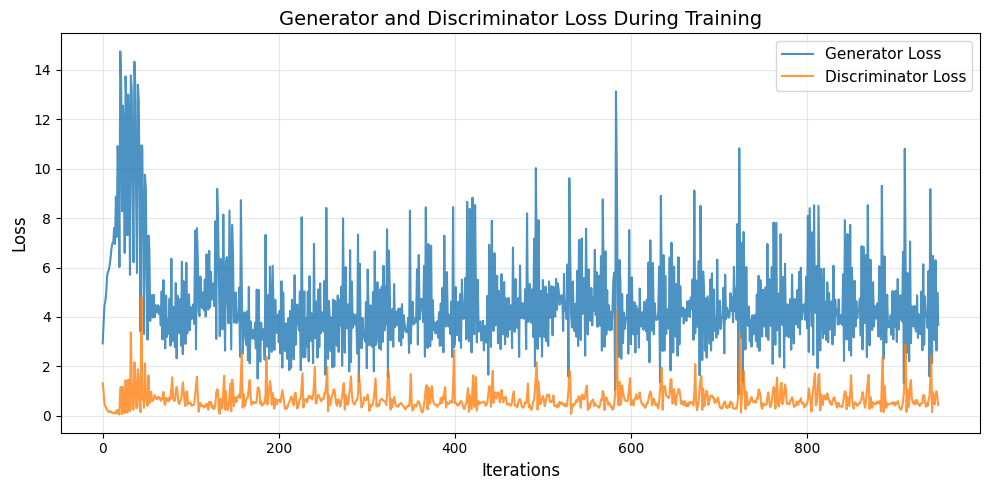

Final Generator Loss: 3.6787
Final Discriminator Loss: 0.4352


In [32]:
# Cell 11: Training Loss Visualization
plt.figure(figsize=(10, 5))
plt.title("Generator and Discriminator Loss During Training", fontsize=14)
plt.plot(G_losses, label="Generator Loss", alpha=0.8)
plt.plot(D_losses, label="Discriminator Loss", alpha=0.8)
plt.xlabel("Iterations", fontsize=12)
plt.ylabel("Loss", fontsize=12)
plt.legend(fontsize=11)
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig('training_loss_curve.png', dpi=150)
plt.show()

print(f"Final Generator Loss: {G_losses[-1]:.4f}")
print(f"Final Discriminator Loss: {D_losses[-1]:.4f}")

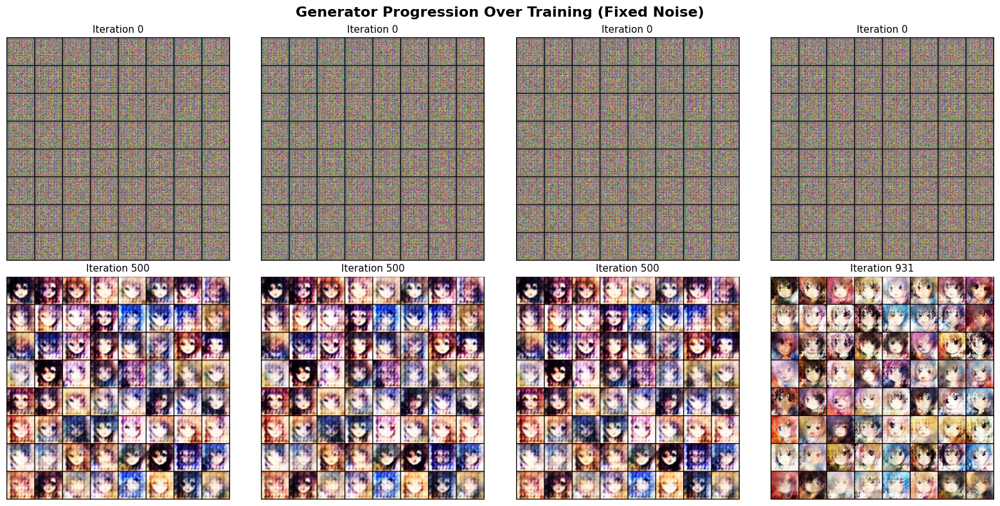

In [33]:
# Cell 12: Generator Progression Visualization
# Show how generation improved over training
fig, axes = plt.subplots(2, 4, figsize=(16, 8))
fig.suptitle('Generator Progression Over Training (Fixed Noise)', fontsize=16, fontweight='bold')

selected_indices = np.linspace(0, len(img_list)-1, 8, dtype=int)
for idx, ax_idx in enumerate(selected_indices):
    ax = axes[idx // 4, idx % 4]
    ax.imshow(np.transpose(img_list[ax_idx], (1, 2, 0)))
    iteration = ax_idx * 500 if ax_idx < len(img_list)-1 else (num_epochs-1) * len(dataloader)
    ax.set_title(f'Iteration {iteration}', fontsize=11)
    ax.axis('off')

plt.tight_layout()
plt.savefig('generator_progression.png', dpi=150, bbox_inches='tight')
plt.show()

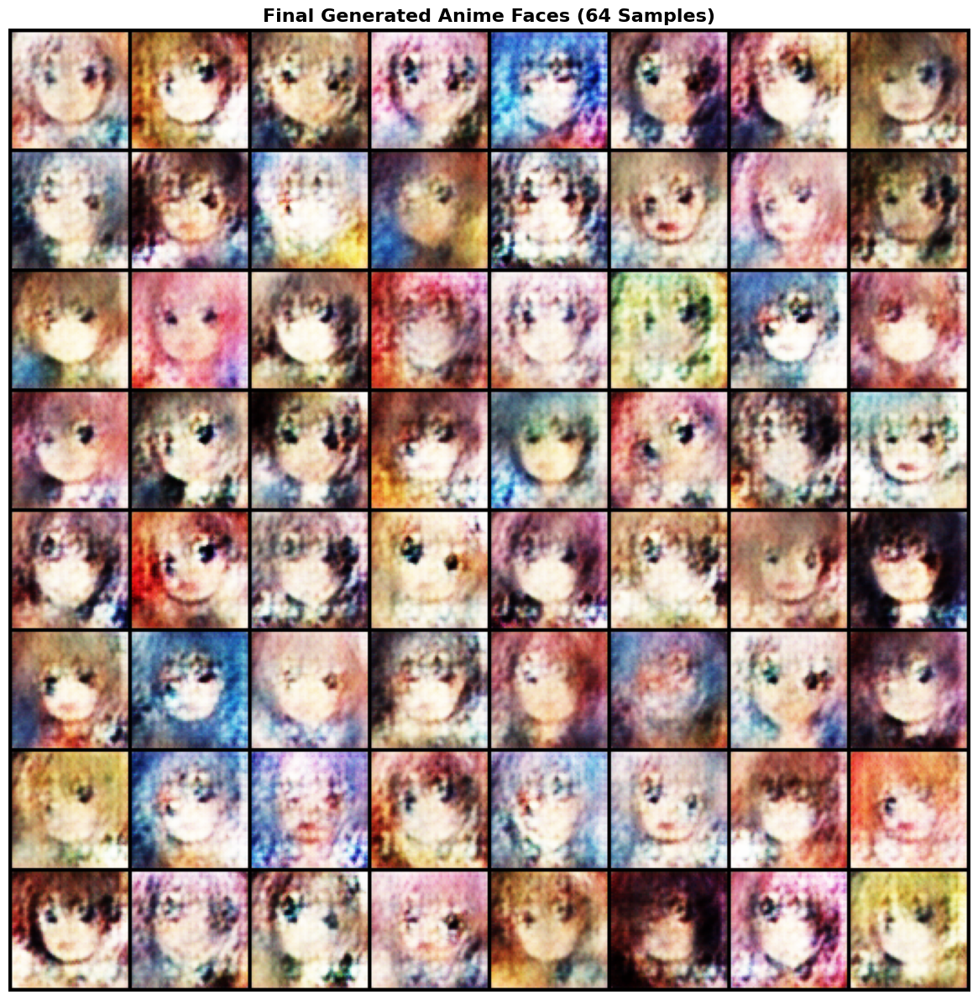

Saved 64 individual images to ./generated_samples/

Model saved as: anime_dcgan_checkpoint.pth
Checkpoint includes: Generator, Discriminator, Optimizers


In [34]:
# Cell 13: Generate Final Results and Save
# Generate batch of images
with torch.no_grad():
    # Generate diverse samples
    final_noise = torch.randn(64, nz, 1, 1, device=device)
    generated_images = netG(final_noise).detach().cpu()
    
    # Create grid visualization
    final_grid = vutils.make_grid(generated_images, nrow=8, padding=2, normalize=True)
    
    plt.figure(figsize=(12, 12))
    plt.axis("off")
    plt.title("Final Generated Anime Faces (64 Samples)", fontsize=16, fontweight='bold')
    plt.imshow(np.transpose(final_grid, (1, 2, 0)))
    plt.tight_layout()
    plt.savefig('final_generated_faces.png', dpi=200, bbox_inches='tight')
    plt.show()
    
    # Save individual images
    output_dir = "generated_samples"
    os.makedirs(output_dir, exist_ok=True)
    
    for i in range(generated_images.size(0)):
        vutils.save_image(generated_images[i], 
                         f"{output_dir}/generated_face_{i:03d}.png",
                         normalize=True)
    
    print(f"Saved {generated_images.size(0)} individual images to ./{output_dir}/")

# Save Models
torch.save({
    'generator': netG.state_dict(),
    'discriminator': netD.state_dict(),
    'optimizerG': optimizerG.state_dict(),
    'optimizerD': optimizerD.state_dict(),
}, 'anime_dcgan_checkpoint.pth')

print("\nModel saved as: anime_dcgan_checkpoint.pth")
print("Checkpoint includes: Generator, Discriminator, Optimizers")

In [35]:
# Cell 14: Model Evaluation Metrics and Summary
def evaluate_model():
    """Print training summary and model statistics."""
    print("="*60)
    print("ANIME FACE GAN TRAINING SUMMARY")
    print("="*60)
    
    print(f"\nDataset Statistics:")
    print(f"  - Total Training Images: {len(dataset)}")
    print(f"  - Image Resolution: {image_size}x{image_size}")
    print(f"  - Batch Size: {batch_size}")
    
    print(f"\nModel Architecture:")
    print(f"  - Generator Params: {sum(p.numel() for p in netG.parameters()):,}")
    print(f"  - Discriminator Params: {sum(p.numel() for p in netD.parameters()):,}")
    print(f"  - Latent Dimension: {nz}")
    
    print(f"\nTraining Configuration:")
    print(f"  - Epochs: {num_epochs}")
    print(f"  - Learning Rate: {lr}")
    print(f"  - Beta1: {beta1}")
    print(f"  - Total Iterations: {len(G_losses)}")
    
    print(f"\nFinal Metrics:")
    print(f"  - Final G Loss: {G_losses[-1]:.4f}")
    print(f"  - Final D Loss: {D_losses[-1]:.4f}")
    print(f"  - G Loss Trend: {'Decreasing' if G_losses[0] > G_losses[-1] else 'Increasing'} "
          f"({G_losses[0]:.4f} -> {G_losses[-1]:.4f})")
    
    print(f"\nOutput Files Generated:")
    print(f"  1. raw_samples_grid.png - Original dataset samples")
    print(f"  2. preprocessing_steps.png - Data augmentation visualization")
    print(f"  3. preprocessed_batch.png - Normalized training batch")
    print(f"  4. training_loss_curve.png - Loss convergence graph")
    print(f"  5. generator_progression.png - Training evolution")
    print(f"  6. final_generated_faces.png - Generated samples grid")
    print(f"  7. anime_dcgan_checkpoint.pth - Model weights")
    print(f"  8. generated_samples/ - Individual PNG images")
    
    print("="*60)
    print("Training pipeline executed successfully!")
    print("="*60)

# Execute evaluation
evaluate_model()

ANIME FACE GAN TRAINING SUMMARY

Dataset Statistics:
  - Total Training Images: 2500
  - Image Resolution: 64x64
  - Batch Size: 128

Model Architecture:
  - Generator Params: 3,576,704
  - Discriminator Params: 2,765,568
  - Latent Dimension: 100

Training Configuration:
  - Epochs: 50
  - Learning Rate: 0.0002
  - Beta1: 0.5
  - Total Iterations: 950

Final Metrics:
  - Final G Loss: 3.6787
  - Final D Loss: 0.4352
  - G Loss Trend: Increasing (2.9323 -> 3.6787)

Output Files Generated:
  1. raw_samples_grid.png - Original dataset samples
  2. preprocessing_steps.png - Data augmentation visualization
  3. preprocessed_batch.png - Normalized training batch
  4. training_loss_curve.png - Loss convergence graph
  5. generator_progression.png - Training evolution
  6. final_generated_faces.png - Generated samples grid
  7. anime_dcgan_checkpoint.pth - Model weights
  8. generated_samples/ - Individual PNG images
Training pipeline executed successfully!


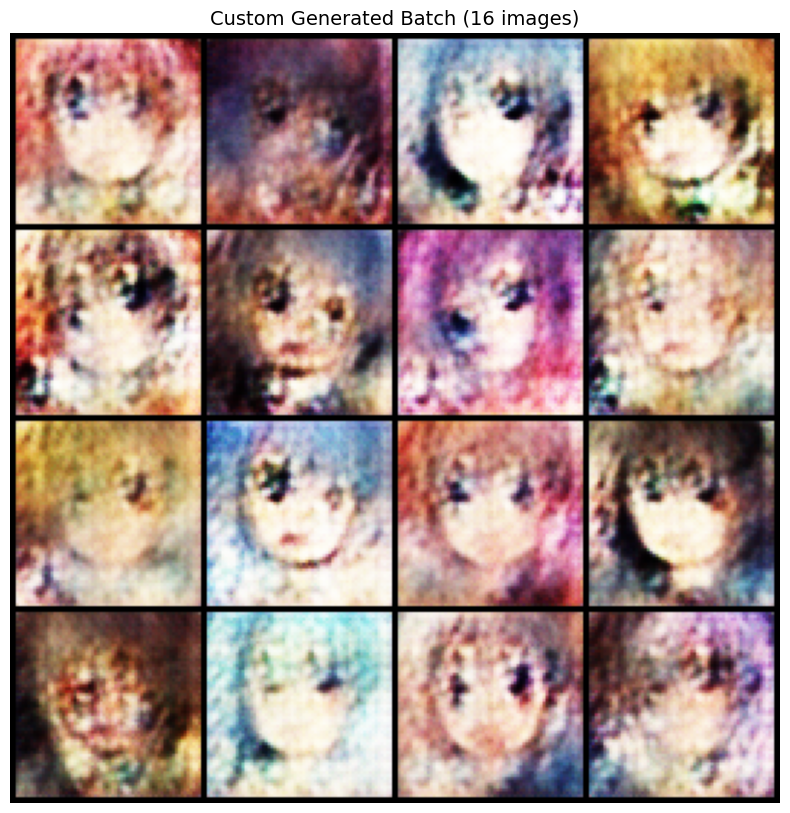

Interactive generation function defined. Call generate_custom_anime() to create new faces!


In [36]:
# Cell 15: Interactive Generation (Optional)
def generate_custom_anime(latent_vector=None, num_samples=16):
    """Generate anime faces from custom or random latent vectors."""
    if latent_vector is None:
        latent_vector = torch.randn(num_samples, nz, 1, 1, device=device)
    else:
        latent_vector = latent_vector.to(device)
    
    with torch.no_grad():
        custom_generated = netG(latent_vector).cpu()
    
    grid = vutils.make_grid(custom_generated, nrow=4, padding=2, normalize=True)
    
    plt.figure(figsize=(10, 10))
    plt.axis("off")
    plt.title(f"Custom Generated Batch ({num_samples} images)", fontsize=14)
    plt.imshow(np.transpose(grid, (1, 2, 0)))
    plt.show()
    
    return custom_generated

# Example usage: Generate 16 random samples
custom_batch = generate_custom_anime()
print("Interactive generation function defined. Call generate_custom_anime() to create new faces!")